In [1]:
!pip install torchinfo -q

In [2]:
import os
import json
from pathlib import Path
from tqdm.auto import tqdm
import numpy as np
import matplotlib.pyplot as plt


import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from PIL import Image

import albumentations as A
from albumentations.pytorch import ToTensorV2
from torchvision.models import resnet34, ResNet34_Weights
from torchinfo import summary


from sklearn.model_selection import train_test_split

# Config

In [3]:

path = '/kaggle/input/datasets/b22dckh065vgiakhi/icpr-ds'
seed = 42
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Dataset config
vocab = "0123456789ABCDEFGHIJKLMNOPQRSTUVWXYZ"
num_classes = len(vocab)   # 36
label_len = 7
img_H, img_W = 32, 128

# Model config
embed_dim = 512
ff_dim = 512 * 4
num_layers = 3
num_heads = 8
drop_out = 0.1

# Training config
lr = 5e-4
batch_size = 64
epochs = 50
log_interval = 1
early_stop_count = 10
warmup_epochs = 3
train_loss = []
val_loss = []
train_acc = []
val_acc = []
best_model_path = '/kaggle/working/03_MeanFusion_ResNet34_Transformer_OCR.pth'

# Set Seed

In [4]:
def set_seed(seed=42):
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(seed)

In [5]:
print(len(os.listdir(os.path.join(path, 'train', 'Scenario-A', 'Brazilian'))) * 10)
print(len(os.listdir(os.path.join(path, 'train', 'Scenario-A', 'Mercosur'))) * 10)
print(len(os.listdir(os.path.join(path, 'train', 'Scenario-B', 'Brazilian'))) * 10)
print(len(os.listdir(os.path.join(path, 'train', 'Scenario-B', 'Mercosur'))) * 10)

50000
50000
20000
80000


# Dataset

In [6]:
class ICPRDataSet(Dataset):
    def __init__(self, path, split='train', val_size=0.2, random_state=42, transform=None):
        self.transform = transform
        self.split = split
        self.degradation = self.get_degradation_transforms()

        if split in ['train', 'val', 'test']:
            data_path = os.path.join(path, 'train')
            all_tracks = self.get_path(data_path, split='train')
            train_tracks, temp_tracks = self.split_tracks(
                all_tracks, test_size=val_size, random_state=random_state
            )
            val_tracks, test_tracks = self.split_tracks(
                temp_tracks, test_size=0.5, random_state=random_state
            )
            if split == 'train':
                self.tracks = train_tracks
            elif split == 'val':
                self.tracks = val_tracks
            elif split == 'test':
                self.tracks = test_tracks
        elif split == 'blind_test':
            data_path = os.path.join(path, 'test')
            self.tracks = self.get_path(data_path, split='test')

        # Flatten thành list các entry, mỗi track tạo 2 entry khi train
        self.entries = self.build_entries(self.tracks)

        print(f'Split: {split}')
        print(f'Number of tracks: {len(self.tracks)}')
        print(f'Number of samples (entries): {len(self.entries)}')

    def get_path(self, path, split):
        tracks = {}
        track_paths = []

        if split == 'test':
            track_names = os.listdir(path)
            for track_name in track_names:
                track_paths.append(os.path.join(path, track_name))
        else:
            scennarios = ['Scenario-A', 'Scenario-B']
            countries = ['Brazilian', 'Mercosur']
            for scennario in scennarios:
                for countrie in countries:
                    data_path = os.path.join(path, scennario, countrie)
                    if not os.path.isdir(data_path):
                        continue
                    for track_name in os.listdir(data_path):
                        track_paths.append(os.path.join(data_path, track_name))

        for track_path in track_paths:
            track_id = os.path.basename(track_path)
            track_lr = []
            track_hr = []
            track_label = None

            for item in os.listdir(track_path):
                item_path = os.path.join(track_path, item)
                if item.lower().startswith('lr'):
                    track_lr.append(item_path)
                elif item.lower().startswith('hr'):
                    track_hr.append(item_path)
                elif item.lower().endswith('.json') and split != 'test':
                    with open(item_path, 'r', encoding='utf-8') as f:
                        annotations = json.load(f)
                    track_label = annotations.get('plate_text').strip()

            tracks[track_id] = {
                'track_path': track_path,
                'lr_paths': sorted(track_lr),
                'hr_paths': sorted(track_hr),
                'label': track_label
            }

        return tracks

    def split_tracks(self, tracks, test_size=0.1, random_state=42):
        track_ids = sorted(tracks.keys())
        train_ids, val_ids = train_test_split(
            track_ids,
            test_size=test_size,
            random_state=random_state,
            shuffle=True
        )
        train_tracks = {tid: tracks[tid] for tid in train_ids}
        val_tracks = {tid: tracks[tid] for tid in val_ids}
        return train_tracks, val_tracks

    def build_entries(self, tracks):
        entries = []
        for track_id, track in tracks.items():
            # Entry 1: LR gốc
            entries.append({
                'entry_id': track_id + '_lr',
                'paths': track['lr_paths'],
                'use_hr': False,
                'label': track['label']
            })
            # Entry 2: HR-degrade (chỉ train)
            if self.split == 'train' and len(track['hr_paths']) > 0:
                entries.append({
                    'entry_id': track_id + '_hr',
                    'paths': track['hr_paths'],
                    'use_hr': True,
                    'label': track['label']
                })
        return entries

    def get_degradation_transforms(self):
        return A.Compose([
            A.OneOf([
                A.GaussianBlur(blur_limit=(3, 5), p=1.0),
                A.MotionBlur(blur_limit=(3, 5), p=1.0)
            ], p=0.7),
            A.OneOf([
                A.GaussNoise(noise_scale_factor=0.1, p=1.0),
                A.MultiplicativeNoise(multiplier=(0.9, 1.1), p=1.0)
            ], p=0.7),
            A.ImageCompression(quality_range=(20, 50), p=0.5),
            A.Downscale(scale_range=(0.3, 0.5), p=0.5) 
        ])

    
    def __len__(self):
        return len(self.entries)

    def __getitem__(self, idx):
        entry = self.entries[idx]

        images = []
        for img_path in entry['paths']:          # luôn đúng 5 frames
            img = np.array(Image.open(img_path).convert('RGB'))

            if entry['use_hr']:
                img = self.degradation(image=img)['image']  # HR → pseudo-LR

            if self.transform is not None:
                img = self.transform(image=img)['image']

            images.append(img)

        return {
            'track_id': entry['entry_id'],
            'images': images,                    # luôn 5 phần tử
            'label': entry['label']
        }

In [7]:
train_transforms = A.Compose([
    A.Resize(height=img_H, width=img_W),
    A.Affine(
        scale=(0.95, 1.05),
        translate_percent=(0.05, 0.05),
        rotate=(-5, 5),
        fill=128,
        p=0.5
    ),
    A.Perspective(scale=(0.02, 0.05), p=0.3),
    A.RandomBrightnessContrast(
        brightness_limit=0.15,
        contrast_limit=0.15,
        p=0.4
    ),
    A.HueSaturationValue(
            hue_shift_limit=10,
            sat_shift_limit=20,
            val_shift_limit=20,
            p=0.3
    ),
    A.ChannelShuffle(p=0.3),
    A.CoarseDropout(
            num_holes_range=(2, 5),
            hole_height_range=(4, 8),
            hole_width_range=(4, 8),
            p=0.3
    ),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2()
])

val_test_transforms = A.Compose([
    A.Resize(height=img_H, width=img_W),
    A.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5)),
    ToTensorV2()
])

In [8]:
def encode_label(label: str) -> torch.Tensor:
    return torch.tensor(
        [vocab.index(c) for c in label.upper()],
        dtype=torch.long
    )  # shape (7,)

In [9]:
def collate_fn_train(batch):
    images = torch.stack([torch.stack(item['images']) for item in batch])
    # (B, F, C, H, W)
    targets = torch.stack([encode_label(item['label']) for item in batch])
    # (B, 7)
    return images, targets

def collate_fn_test(batch):
    images   = torch.stack([torch.stack(item['images']) for item in batch])
    targets  = torch.stack([encode_label(item['label']) for item in batch])
    track_ids = [item['track_id'] for item in batch]
    return images, targets, track_ids  

def collate_fn_blind_test(batch):
    images = torch.stack([torch.stack(item['images']) for item in batch])
    # (B, F, C, H, W)
    track_ids = [item['track_id'] for item in batch]
    return images, track_ids

In [10]:
train_dataset = ICPRDataSet(path, split='train', transform=train_transforms)
val_dataset = ICPRDataSet(path, split='val', transform=val_test_transforms)
test_dataset = ICPRDataSet(path, split='test', transform=val_test_transforms)
blind_test_dataset = ICPRDataSet(path, split='blind_test', transform=val_test_transforms)

Split: train
Number of tracks: 16000
Number of samples (entries): 32000
Split: val
Number of tracks: 2000
Number of samples (entries): 2000
Split: test
Number of tracks: 2000
Number of samples (entries): 2000
Split: blind_test
Number of tracks: 1000
Number of samples (entries): 1000


In [11]:




train_loader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    collate_fn=collate_fn_train, 
    num_workers=4,       
    pin_memory=True 
    
)
val_loader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    collate_fn=collate_fn_train,
    num_workers=4,       
    pin_memory=True 
)

test_loader = DataLoader(
    test_dataset,
    batch_size=batch_size,
    shuffle=False,
    collate_fn=collate_fn_test,
#     num_workers=4,       
#     pin_memory=True 
)

blind_test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, collate_fn=collate_fn_blind_test)

In [12]:
def unnormalize(tensor):
    """tensor: (C, H, W)"""
    mean = torch.tensor([0.5, 0.5, 0.5]).view(3, 1, 1)
    std  = torch.tensor([0.5, 0.5, 0.5]).view(3, 1, 1)
    return (tensor * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()


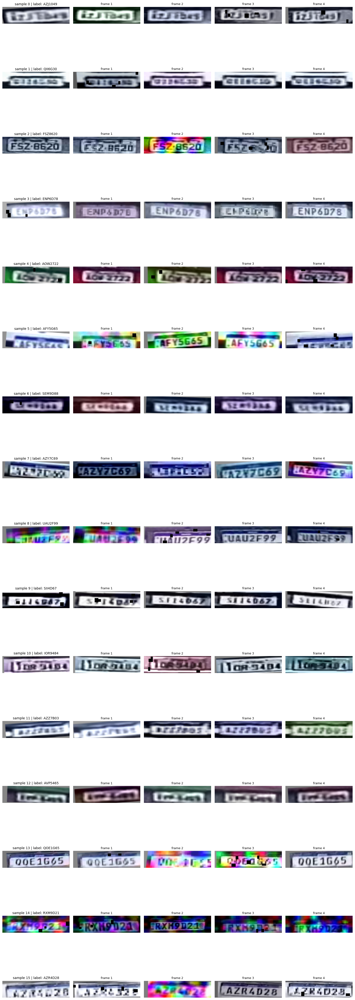

Batch shape: torch.Size([64, 5, 3, 32, 128]), Targets shape: torch.Size([64, 7])


In [13]:
# Visualize one batch from train_loader
images, targets = next(iter(train_loader))  # images: (B, F, C, H, W), targets: (B, 7)

B, Fm, C, H, W = images.shape
show_samples = min(16, B)
show_frames = min(5, Fm)

fig, axes = plt.subplots(show_samples, show_frames, figsize=(3 * show_frames, 2.8 * show_samples))

# Normalize axes shape for cases when rows/cols == 1
if show_samples == 1 and show_frames == 1:
    axes = np.array([[axes]])
elif show_samples == 1:
    axes = axes[np.newaxis, :]
elif show_frames == 1:
    axes = axes[:, np.newaxis]

for i in range(show_samples):
    label_str = ''.join(vocab[idx] for idx in targets[i].tolist())
    for j in range(show_frames):
        img = unnormalize(images[i, j].cpu())

        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        if j == 0:
            ax.set_title(f'sample {i} | label: {label_str}', fontsize=10)
        else:
            ax.set_title(f'frame {j}', fontsize=9)

plt.tight_layout()
plt.show()

print(f'Batch shape: {images.shape}, Targets shape: {targets.shape}')

# Baseline 2: Multi Frame ORC - ResNet34 + Transformer

In [14]:
class STNBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.localization = nn.Sequential(
            nn.Conv2d(in_channels, 32, kernel_size=5, stride=2, padding=2),
            nn.MaxPool2d(2, 2),
            nn.ReLU(True),
            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.AdaptiveAvgPool2d((4, 8))
        )
        self.fc_loc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(64 * 4 * 8, 128),
            nn.ReLU(True),
            nn.Linear(128, 6)
        )
        with torch.no_grad():
            self.fc_loc[-1].weight.zero_()
            self.fc_loc[-1].bias.copy_(
                torch.tensor([1, 0, 0, 0, 1, 0], dtype=torch.float)
            )
    
    def forward(self, x):
        x = self.localization(x)
        x = self.fc_loc(x)
        x = x.view(-1, 2, 3)
        return x

In [15]:
class FeatureExtractor(nn.Module):
    def __init__(self, pretrained=True, out_dim=512, freeze_backbone=False):
        super().__init__()
        weights = ResNet34_Weights.IMAGENET1K_V1 if pretrained else None
        backbone = resnet34(weights=weights)

        self.conv1   = backbone.conv1
        self.bn1     = backbone.bn1
        self.relu    = backbone.relu
        self.maxpool = backbone.maxpool
        self.layer1  = backbone.layer1
        self.layer2  = backbone.layer2
        self.layer3  = backbone.layer3
        self.layer4  = backbone.layer4

        # Modify stride (2,2) -> (2,1): keep width, shrink height only
        # ResNet34 uses BasicBlock: stride is in conv1 (not conv2 like Bottleneck)
        self.layer3[0].conv1.stride = (2, 1)
        self.layer3[0].downsample[0].stride = (2, 1)
        self.layer4[0].conv1.stride = (2, 1)
        self.layer4[0].downsample[0].stride = (2, 1)

        # ResNet34 layer4 output = 512 channels -> project to out_dim
        self.proj = nn.Conv2d(512, out_dim, kernel_size=1)

        if freeze_backbone:
            for name, p in self.named_parameters():
                if 'proj' not in name:
                    p.requires_grad = False

    def forward(self, x):
        x = self.conv1(x)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.maxpool(x)
        x = self.layer1(x)
        x = self.layer2(x)
        x = self.layer3(x)
        x = self.layer4(x)
        x = self.proj(x)                              # (B, out_dim, H', W')
        x = F.adaptive_avg_pool2d(x, (1, None))       # (B, out_dim, 1, W')
        return x

In [16]:
class MeanFusion(nn.Module):
    def __init__(self, num_frames=5):
        super().__init__()
        self.num_frames = num_frames

    def forward(self, x):
        total_frames, C, H, W = x.size()
        batch_size = total_frames // self.num_frames

        # Reshape to [Batch_size, Frames, C, H, W]
        x_view = x.view(batch_size, self.num_frames, C, H, W)

        # Mean fusion over frames
        fused_features = x_view.mean(dim=1)
        return fused_features


In [17]:
class pos_encoding(nn.Module):
    def __init__(self, embed_dim, max_length=500):
        super().__init__()
        self.pos_encoding = nn.Parameter(
            (embed_dim ** -0.5) * torch.randn(1, max_length, embed_dim)
        )

    def forward(self, x):
        B, T, C = x.shape
        return x + self.pos_encoding[:, :T, :]

In [18]:
class TransformerEncoderBlock(nn.Module):
    def __init__(self, embed_dim, ff_dim, num_heads, drop_out):
        super().__init__()
        self.attn = nn.MultiheadAttention(embed_dim, num_heads, dropout=drop_out, batch_first=True)
        self.ff = nn.Sequential(
            nn.Linear(embed_dim, ff_dim),
            nn.GELU(),
            nn.Linear(ff_dim, embed_dim)
        )
        self.layernorm1 = nn.LayerNorm(embed_dim, eps=1e-6)
        self.layernorm2 = nn.LayerNorm(embed_dim, eps=1e-6)
        self.drop1 = nn.Dropout(drop_out)
        self.drop2 = nn.Dropout(drop_out)

    def forward(self, q, k, v):
        q_norm = self.layernorm1(q)
        k_norm = self.layernorm1(k)
        v_norm = self.layernorm1(v)

        attn_out, _ = self.attn(q_norm, k_norm, v_norm)
        attn_out = self.drop1(attn_out)
        out1 = attn_out + q

        out1_norm = self.layernorm2(out1)
        ff_out = self.ff(out1_norm)
        ff_out = self.drop2(ff_out)
        out2 = ff_out + out1

        return out2

In [19]:
class TransformerEncoder(nn.Module):
    def __init__(self, embed_dim, ff_dim, num_layers, num_heads, drop_out):
        super().__init__()

        self.blocks = nn.ModuleList([
            TransformerEncoderBlock(
                embed_dim, ff_dim, num_heads, drop_out
            ) for _ in range(num_layers)
        ])

    def forward(self, x):
        output = x
        for block in self.blocks:
            output = block(output, output, output)
        return output

In [20]:
class ResTranOCR(nn.Module):
    def __init__(self, label_len, num_classes, embed_dim, ff_dim, num_layers, num_heads,
                 extractor_pretrained=True, freeze_extractor=True, drop_out=0.1):
        super().__init__()
        self.label_len = label_len
        self.stn           = STNBlock(3)
        self.extractor     = FeatureExtractor(pretrained=extractor_pretrained,
                                      out_dim=embed_dim,
                                      freeze_backbone=freeze_extractor)
        self.attn_fusion   = MeanFusion(num_frames=5)
        self.pos_encoder   = pos_encoding(embed_dim, max_length=5000)
        self.transformer_layer = TransformerEncoder(
            embed_dim, ff_dim, num_layers, num_heads, drop_out
        )
        self.head = nn.Linear(embed_dim, num_classes)  # 36

    def forward(self, x):
        B, Frames, C, H, W = x.size()

        x_flat    = x.view(B * Frames, C, H, W)
        theta     = self.stn(x_flat)
        grid      = F.affine_grid(theta, x_flat.size(), align_corners=False)
        x_aligned = F.grid_sample(x_flat, grid, align_corners=False)

        features  = self.extractor(x_aligned)       # (B*F, embed_dim, H', W')

        fused     = self.attn_fusion(features)       # (B, embed_dim, H', W')

        seq_input = fused.squeeze(2).permute(0, 2, 1)  # (B, W', out_dim)
        seq_input = self.pos_encoder(seq_input)
        seq_out   = self.transformer_layer(seq_input)   # (B, T, embed_dim)

        # Pool T timestep → đúng 7 vị trí
        # AdaptiveAvgPool hoạt động trên dim T
        seq_out = seq_out.permute(0, 2, 1)              # (B, embed_dim, T)
        seq_out = F.adaptive_avg_pool1d(seq_out, self.label_len)  # (B, embed_dim, 7)
        seq_out = seq_out.permute(0, 2, 1)              # (B, 7, embed_dim)

        out = self.head(seq_out)                        # (B, 7, 36)
        return out                                      

In [21]:
model = ResTranOCR(
    label_len=label_len,
    num_classes=num_classes,
    embed_dim=embed_dim,
    ff_dim=ff_dim,
    num_layers=num_layers,
    num_heads=num_heads,
    extractor_pretrained=True,
    freeze_extractor=True,
    drop_out=drop_out
    ).to(device)

Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth


100%|██████████| 83.3M/83.3M [00:00<00:00, 191MB/s]


In [22]:
summary(model, input_size=(1, 5, 3, img_H, img_W), device=device)

Layer (type:depth-idx)                             Output Shape              Param #
ResTranOCR                                         [1, 7, 36]                --
├─STNBlock: 1-1                                    [5, 2, 3]                 --
│    └─Sequential: 2-1                             [5, 64, 4, 8]             --
│    │    └─Conv2d: 3-1                            [5, 32, 16, 64]           2,432
│    │    └─MaxPool2d: 3-2                         [5, 32, 8, 32]            --
│    │    └─ReLU: 3-3                              [5, 32, 8, 32]            --
│    │    └─Conv2d: 3-4                            [5, 64, 8, 32]            18,496
│    │    └─ReLU: 3-5                              [5, 64, 8, 32]            --
│    │    └─AdaptiveAvgPool2d: 3-6                 [5, 64, 4, 8]             --
│    └─Sequential: 2-2                             [5, 6]                    --
│    │    └─Flatten: 3-7                           [5, 2048]                 --
│    │    └─Linear: 3-8     

In [23]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=epochs, eta_min=1e-6
)

In [24]:
def decode_pred(logits):
    """logits: (B, 7, 36) → list of str"""
    indices = logits.argmax(dim=2)  # (B, 7)
    return ["".join(vocab[i] for i in seq.tolist()) for seq in indices]

In [25]:
def compute_accuracy(logits, targets):
    """Sequence accuracy — đúng cả 7 ký tự mới tính đúng"""
    preds = logits.argmax(dim=2)    # (B, 7)
    correct = (preds == targets).all(dim=1).sum().item()
    return correct / targets.size(0)

In [26]:
# For multi-gpu
if torch.cuda.device_count() > 1:
    print("Using", torch.cuda.device_count(), "GPUs")
    model = nn.DataParallel(model)

model = model.to(device)

Using 2 GPUs


# Training

In [27]:
def visualize_val_samples(model, val_loader, device, n_samples=2):
    """Lấy batch đầu val, show n_samples — mỗi sample 1 hàng gồm frame 0."""
    model.eval()
    images, targets = next(iter(val_loader))
    images_dev = images[:n_samples].to(device)

    with torch.no_grad():
        logits = model(images_dev)                     # (n, 7, 36)

    preds = decode_pred(logits.cpu())                  # list of str
    gts   = [''.join(vocab[i] for i in t.tolist())
              for t in targets[:n_samples]]            # list of str

    fig, axes = plt.subplots(
        n_samples, 1,
        figsize=(6, 2.5 * n_samples)
    )
    if n_samples == 1:
        axes = [axes]

    for i in range(n_samples):
        ax = axes[i]
        img = unnormalize(images[i, 0].cpu())          # frame 0, (H,W,C)
        ax.imshow(img)
        ax.axis('off')

        correct = preds[i] == gts[i]
        color   = 'green' if correct else 'red'
        ax.set_title(
            f'GT: {gts[i]}   |   Pred: {preds[i]}',
            fontsize=11, color=color, fontweight='bold'
        )

    plt.suptitle('Val sample preview', fontsize=12, y=1.01)
    plt.tight_layout()
    plt.show()

In [28]:
def train(model, optimizer, scheduler, criterion,
          train_loader, val_loader,
          epochs, early_stop_count, best_model_path,
          log_interval, warmup_epochs=0, device='cpu'):

    # best_val_loss = float('inf')
    best_val_acc = 0.0 # switch to acc for orc all 7 char 
    break_count   = 0
    train_loss_hist, val_loss_hist = [], []
    train_acc_hist,  val_acc_hist  = [], []

    base_model = model.module if isinstance(model, nn.DataParallel) else model

    if warmup_epochs > 0:
        for p in base_model.extractor.parameters():
            p.requires_grad = False
        print(f'Warmup: freeze extractor for first {warmup_epochs} epochs')

    for epoch in tqdm(range(epochs), desc='Epoch', position=0):

        if warmup_epochs > 0 and epoch == warmup_epochs:
            for p in base_model.extractor.parameters():
                p.requires_grad = True
            print(f'Unfreeze extractor at epoch {epoch}')

        # Train 
        model.train()
        if warmup_epochs > 0 and epoch < warmup_epochs:
            base_model.extractor.eval()

        epoch_loss = epoch_acc = 0

        for images, targets in tqdm(train_loader, desc='Train', position=1, leave=False):
            images  = images.to(device)
            targets = targets.to(device)

            optimizer.zero_grad()
            logits = model(images)

            loss = criterion(logits.permute(0, 2, 1), targets)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)
            optimizer.step()

            epoch_loss += loss.item()
            epoch_acc  += compute_accuracy(logits.detach().cpu(), targets.cpu())

        train_loss_hist.append(epoch_loss / len(train_loader))
        train_acc_hist.append(epoch_acc  / len(train_loader))

        # Validation
        model.eval()
        epoch_loss = epoch_acc = 0

        with torch.no_grad():
            for images, targets in tqdm(val_loader, desc='Val', position=1, leave=False):
                images  = images.to(device)
                targets = targets.to(device)

                logits = model(images)
                loss   = criterion(logits.permute(0, 2, 1), targets)

                epoch_loss += loss.item()
                epoch_acc  += compute_accuracy(logits.cpu(), targets.cpu())

        val_loss_hist.append(epoch_loss / len(val_loader))
        val_acc_hist.append(epoch_acc  / len(val_loader))

        scheduler.step()

        # Log + Visual 
        if epoch % log_interval == 0:
            print(
                f'| Epoch {epoch:3d} '
                f'| Train Loss {train_loss_hist[-1]:.4f}  Acc {train_acc_hist[-1]:.4f} '
                f'| Val Loss {val_loss_hist[-1]:.4f}  Acc {val_acc_hist[-1]:.4f} |'
            )
            visualize_val_samples(model, val_loader, device, n_samples=2)

        # Checkpoint + Early stop
        if val_acc_hist[-1] > best_val_acc:
            break_count   = 0
            best_val_acc = val_acc_hist[-1]
            torch.save({
                'epoch':                epoch,
                'model_state_dict':     base_model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'best_val_acc':         val_acc_hist[-1],
                'break_count':          break_count,
                'train_loss_hist':      train_loss_hist,
                'val_loss_hist':        val_loss_hist,
                'train_acc_hist':       train_acc_hist,
                'val_acc_hist':         val_acc_hist,
            }, best_model_path)
        else:
            break_count += 1

        if break_count >= early_stop_count:
            print(f'Early stop tại epoch {epoch} | best val loss: {best_val_acc:.4f}')
            break

        train_loss.append(train_loss_hist[-1])
        val_loss.append(val_loss_hist[-1])
        train_acc.append(train_acc_hist[-1])
        val_acc.append(val_acc_hist[-1])

    checkpoint = torch.load(best_model_path, map_location=device)

    base_model = model.module if isinstance(model, nn.DataParallel) else model
    base_model.load_state_dict(checkpoint['model_state_dict'], strict=True)

    model.eval()
    print('Training hoàn tất, đã load best model')

    return model, {
        'train_loss': train_loss_hist,
        'val_loss':   val_loss_hist,
        'train_acc':  train_acc_hist,
        'val_acc':    val_acc_hist,
    }

Warmup: freeze extractor for first 3 epochs


Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch   0 | Train Loss 2.2468  Acc 0.0007 | Val Loss 1.9018  Acc 0.0029 |


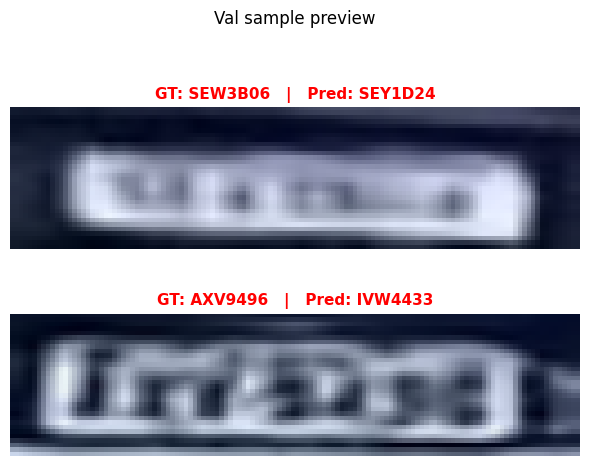

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch   1 | Train Loss 1.5706  Acc 0.0145 | Val Loss 1.4962  Acc 0.0146 |


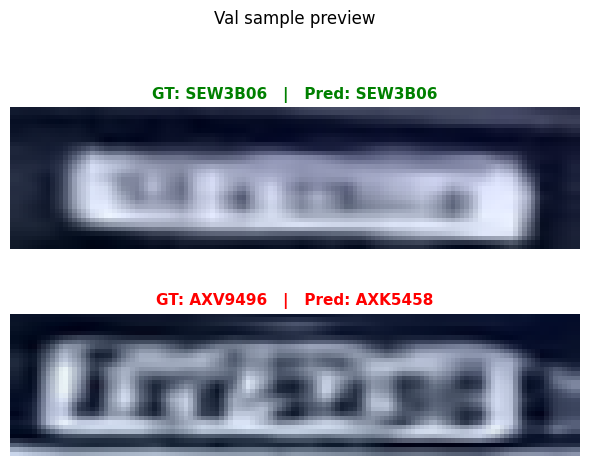

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch   2 | Train Loss 1.2776  Acc 0.0468 | Val Loss 1.3193  Acc 0.0376 |


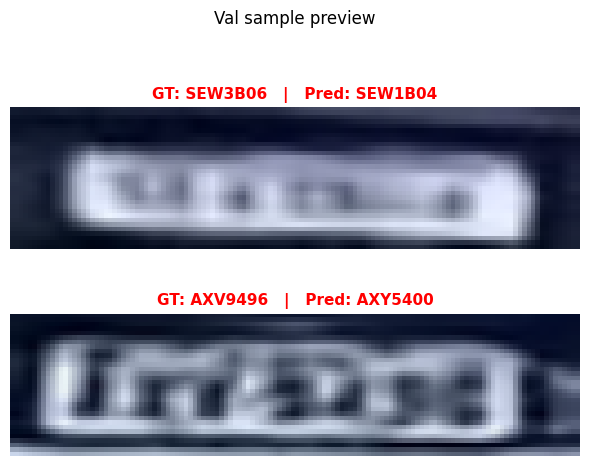

Unfreeze extractor at epoch 3


Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch   3 | Train Loss 0.5127  Acc 0.4973 | Val Loss 0.5710  Acc 0.4272 |


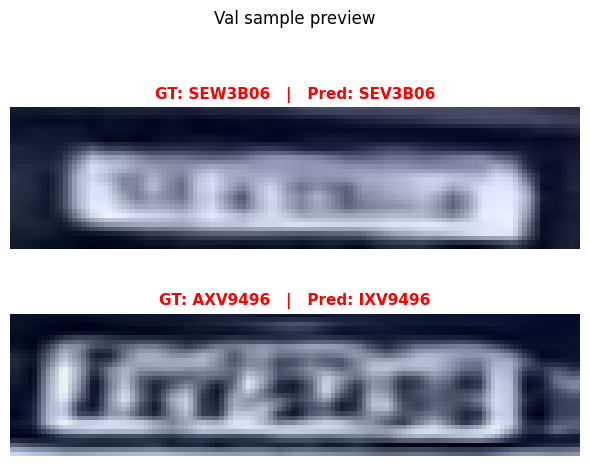

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch   4 | Train Loss 0.2458  Acc 0.7065 | Val Loss 0.3726  Acc 0.5908 |


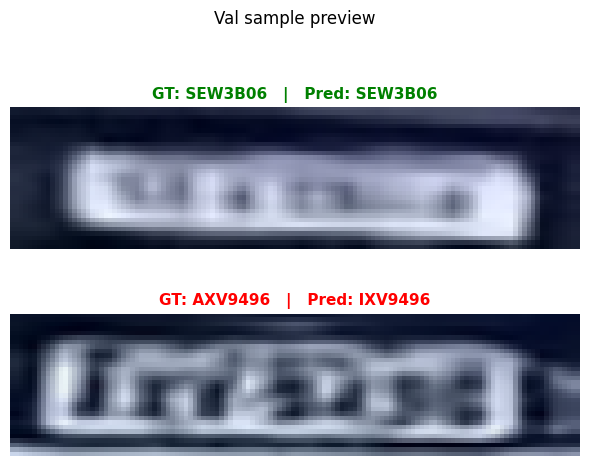

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch   5 | Train Loss 0.2013  Acc 0.7548 | Val Loss 0.3296  Acc 0.6284 |


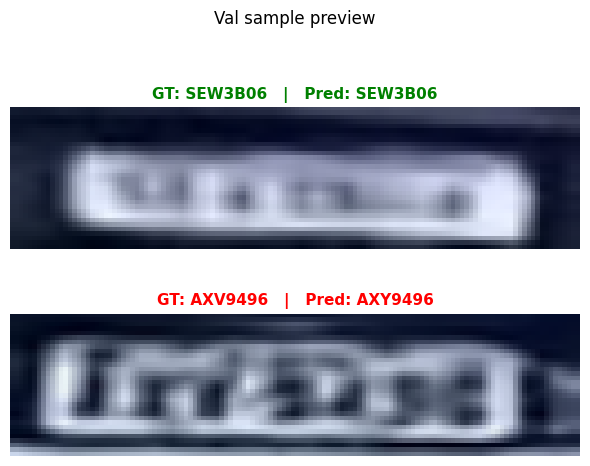

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch   6 | Train Loss 0.1778  Acc 0.7784 | Val Loss 0.3365  Acc 0.6372 |


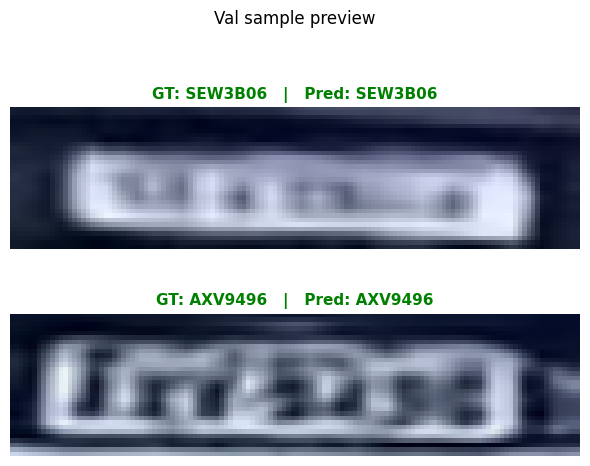

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch   7 | Train Loss 0.1607  Acc 0.7924 | Val Loss 0.3006  Acc 0.6787 |


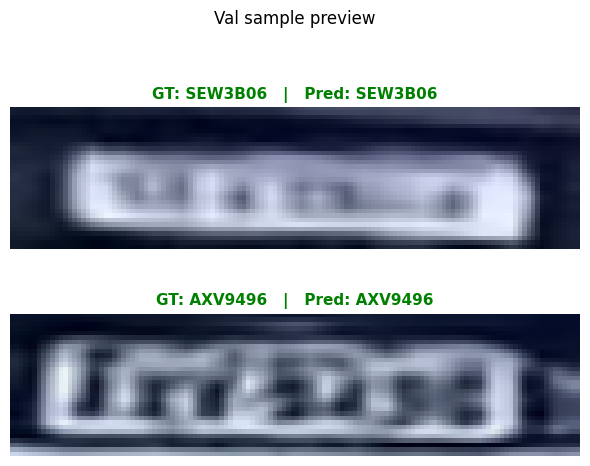

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch   8 | Train Loss 0.1427  Acc 0.8134 | Val Loss 0.3036  Acc 0.6812 |


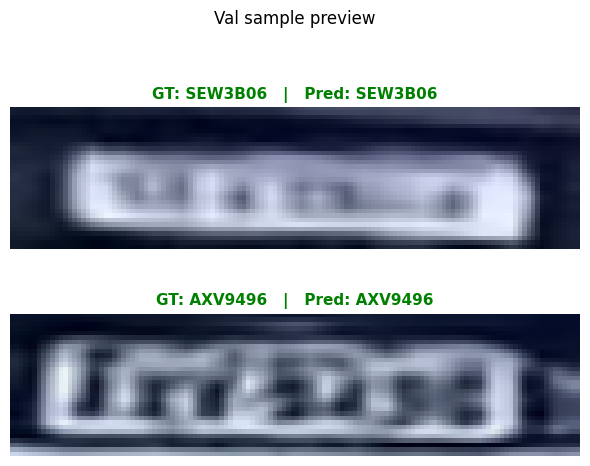

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch   9 | Train Loss 0.1354  Acc 0.8220 | Val Loss 0.3367  Acc 0.6572 |


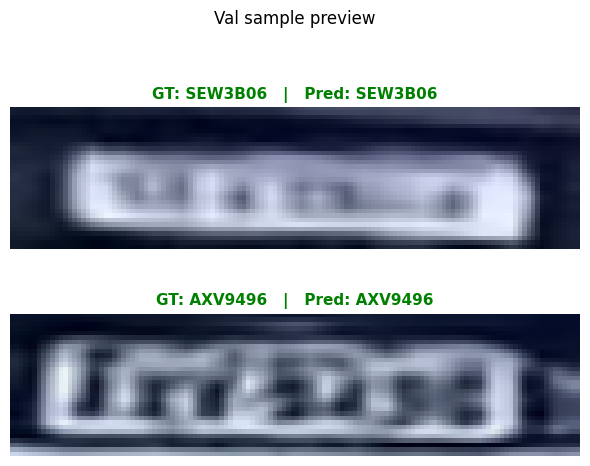

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  10 | Train Loss 0.1251  Acc 0.8310 | Val Loss 0.2895  Acc 0.6777 |


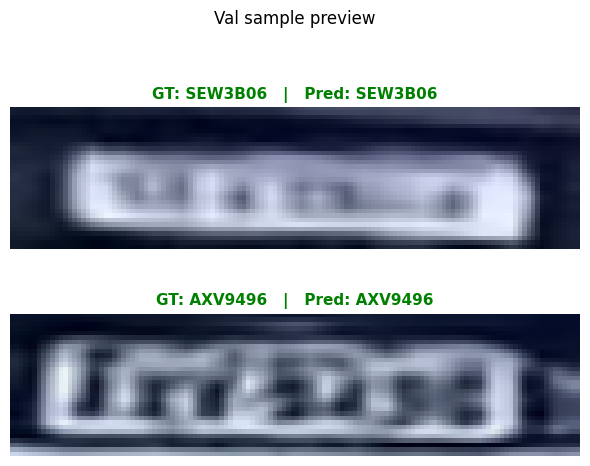

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  11 | Train Loss 0.1150  Acc 0.8412 | Val Loss 0.2904  Acc 0.6987 |


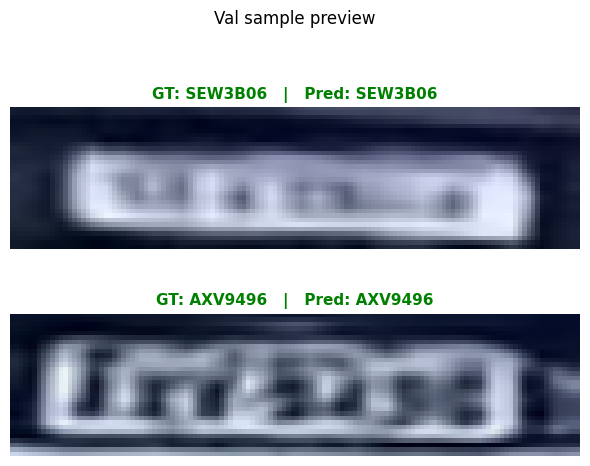

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  12 | Train Loss 0.1100  Acc 0.8465 | Val Loss 0.2832  Acc 0.6909 |


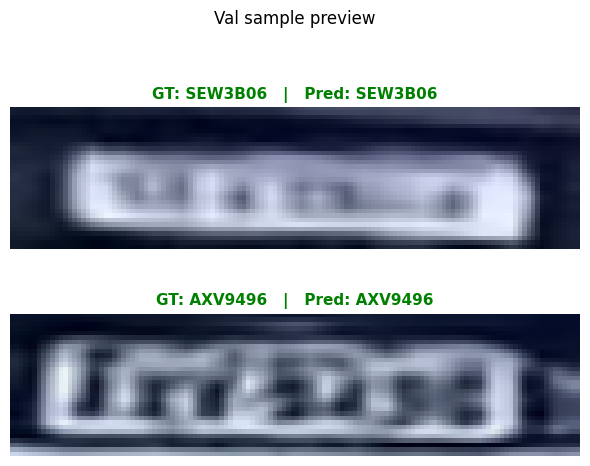

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  13 | Train Loss 0.1001  Acc 0.8546 | Val Loss 0.2924  Acc 0.7070 |


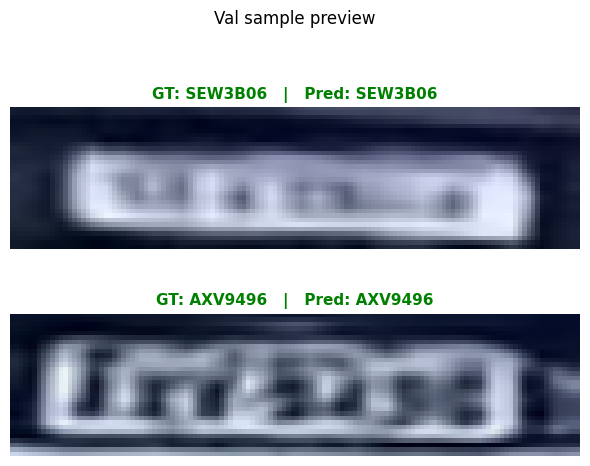

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  14 | Train Loss 0.0906  Acc 0.8684 | Val Loss 0.2851  Acc 0.7144 |


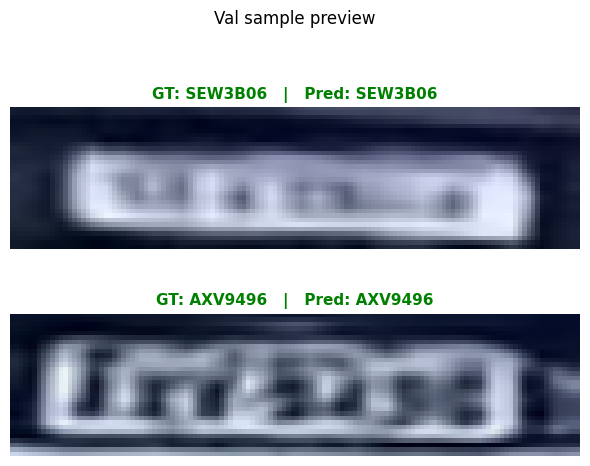

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  15 | Train Loss 0.0840  Acc 0.8755 | Val Loss 0.2985  Acc 0.7061 |


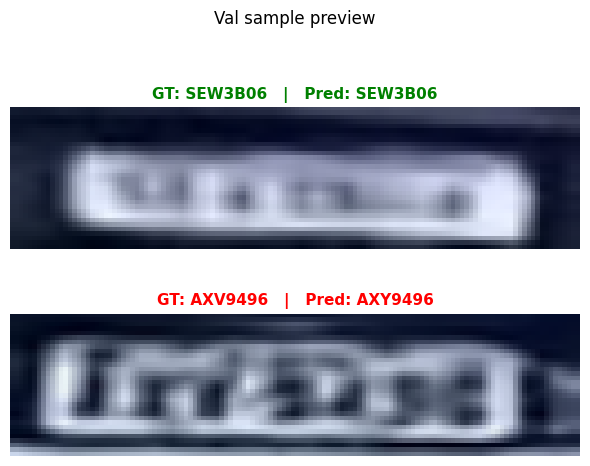

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  16 | Train Loss 0.0765  Acc 0.8834 | Val Loss 0.2990  Acc 0.7148 |


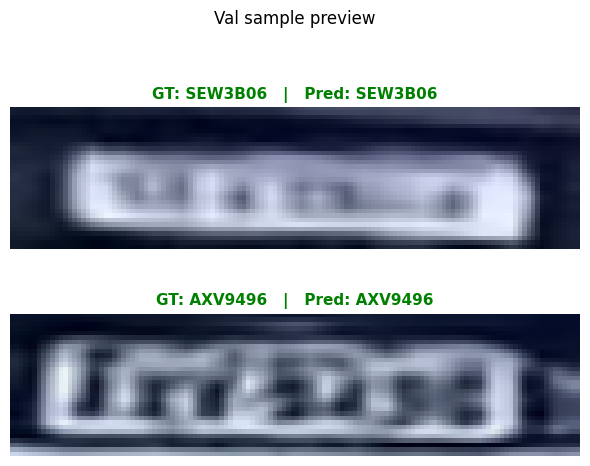

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  17 | Train Loss 0.0706  Acc 0.8884 | Val Loss 0.3179  Acc 0.6963 |


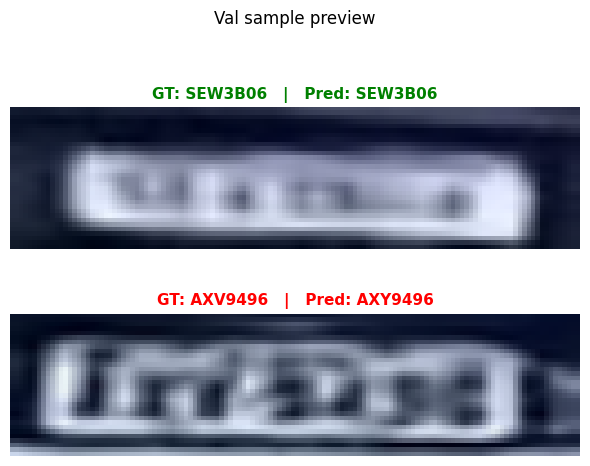

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  18 | Train Loss 0.0641  Acc 0.8963 | Val Loss 0.3031  Acc 0.7095 |


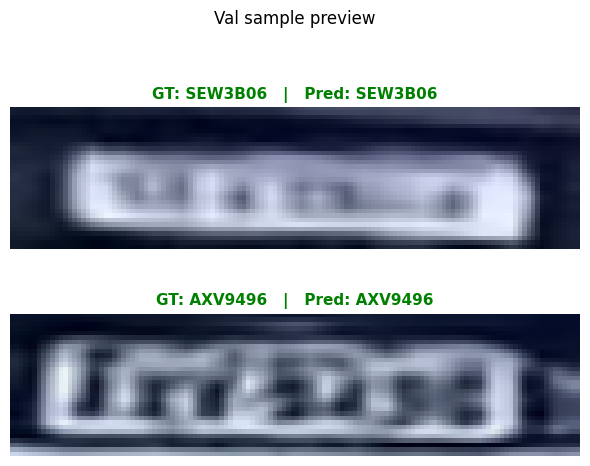

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  19 | Train Loss 0.0563  Acc 0.9080 | Val Loss 0.3287  Acc 0.7197 |


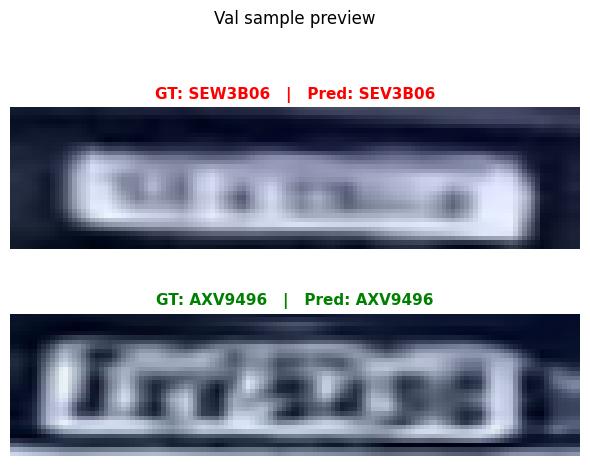

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  20 | Train Loss 0.0524  Acc 0.9109 | Val Loss 0.3080  Acc 0.7227 |


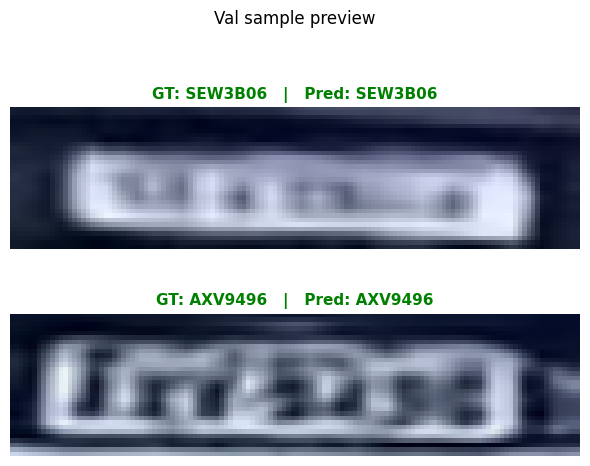

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  21 | Train Loss 0.0460  Acc 0.9195 | Val Loss 0.3239  Acc 0.7349 |


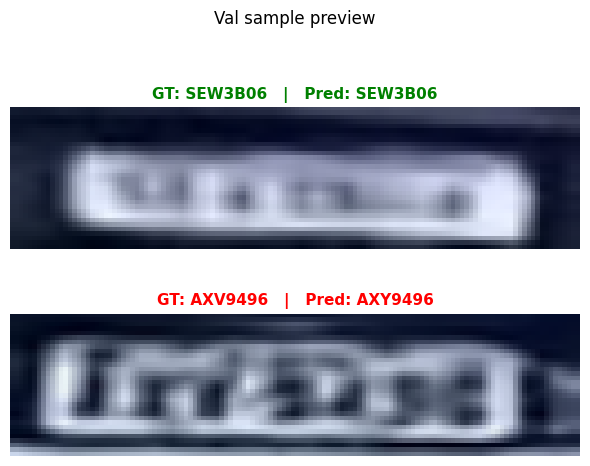

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  22 | Train Loss 0.0423  Acc 0.9241 | Val Loss 0.3199  Acc 0.7354 |


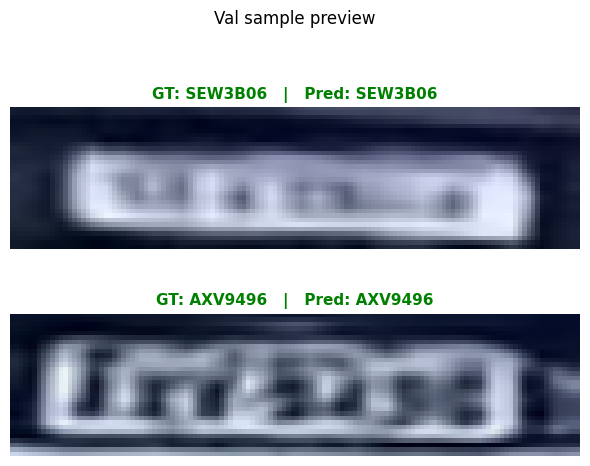

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  23 | Train Loss 0.0363  Acc 0.9340 | Val Loss 0.3353  Acc 0.7339 |


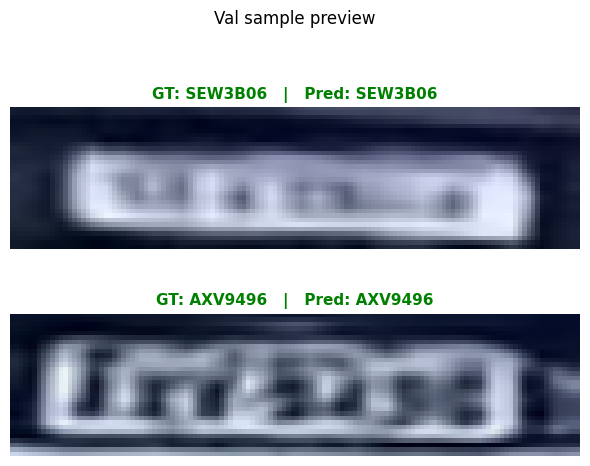

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  24 | Train Loss 0.0317  Acc 0.9399 | Val Loss 0.3407  Acc 0.7388 |


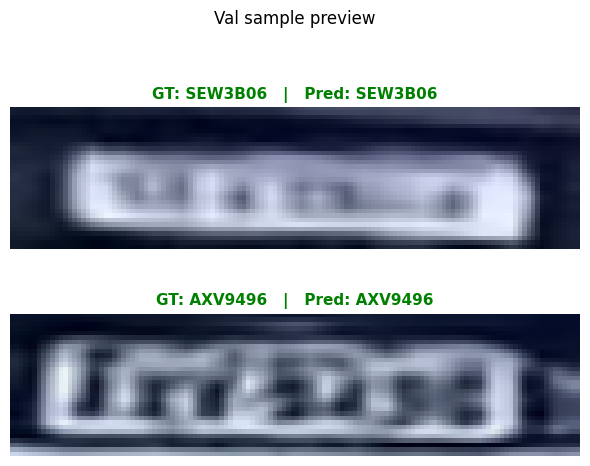

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  25 | Train Loss 0.0291  Acc 0.9462 | Val Loss 0.3646  Acc 0.7520 |


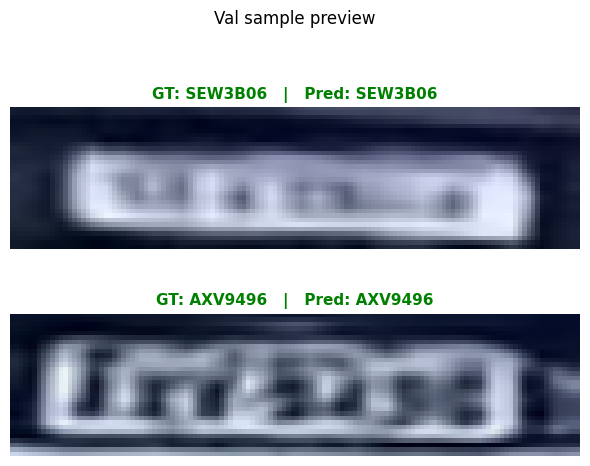

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  26 | Train Loss 0.0266  Acc 0.9490 | Val Loss 0.3482  Acc 0.7295 |


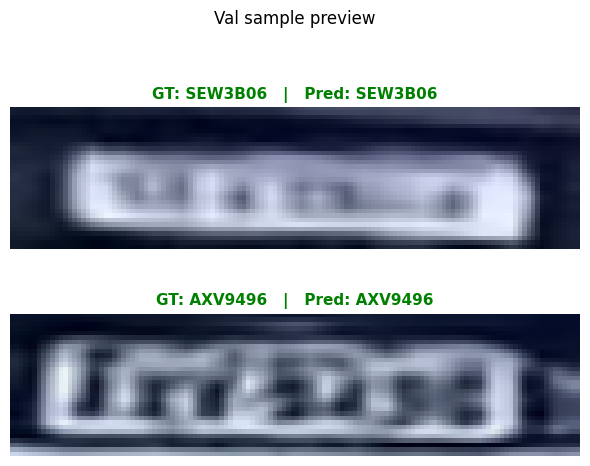

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  27 | Train Loss 0.0221  Acc 0.9563 | Val Loss 0.3610  Acc 0.7485 |


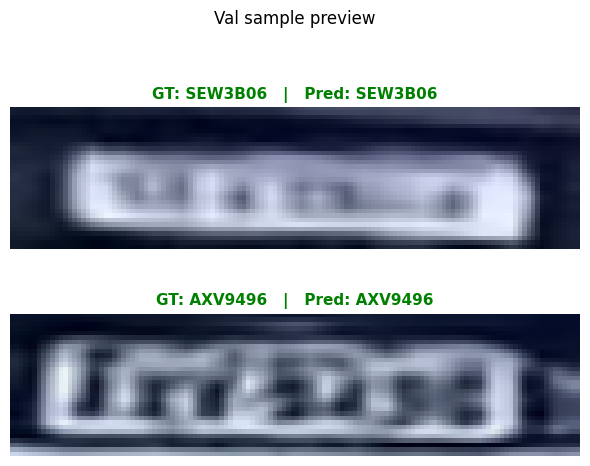

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  28 | Train Loss 0.0194  Acc 0.9597 | Val Loss 0.3792  Acc 0.7393 |


Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f97c9130900>
Traceback (most recent call last):
Exception ignored in:   File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
<function _MultiProcessingDataLoaderIter.__del__ at 0x7f97c9130900>    
self._shutdown_workers()Traceback (most recent call last):

  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
  File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1707, in __del__
        if w.is_alive():
self._shutdown_workers()
    File "/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py", line 1690, in _shutdown_workers
       if w.is_alive():  
^^  ^  ^ ^ ^ ^^^^^^^^^^^^
  File "/usr/lib/python3.12/multiprocessing/process.py", line 160, in is_alive
^^    assert self._parent_pid == os.getpid(), 'can only test a child process'^^^
^ 
   File "/usr/lib/pyth

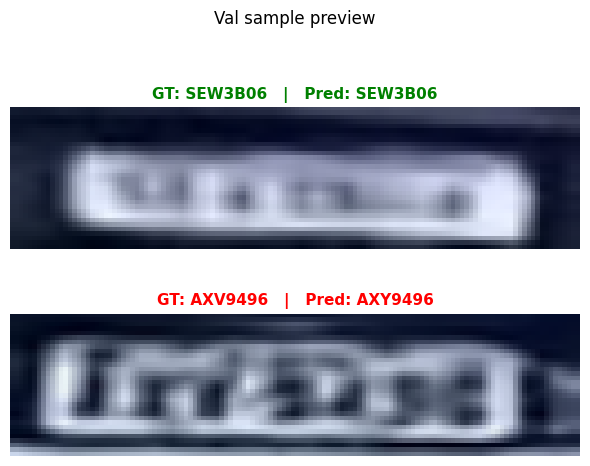

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  29 | Train Loss 0.0175  Acc 0.9665 | Val Loss 0.3902  Acc 0.7534 |


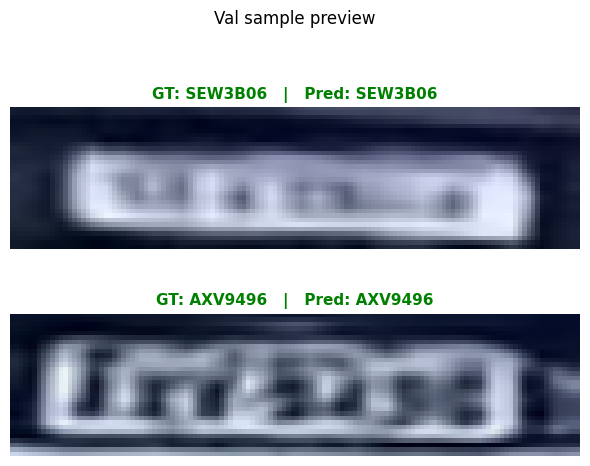

Train:   0%|          | 0/500 [00:00<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  30 | Train Loss 0.0161  Acc 0.9682 | Val Loss 0.3995  Acc 0.7466 |


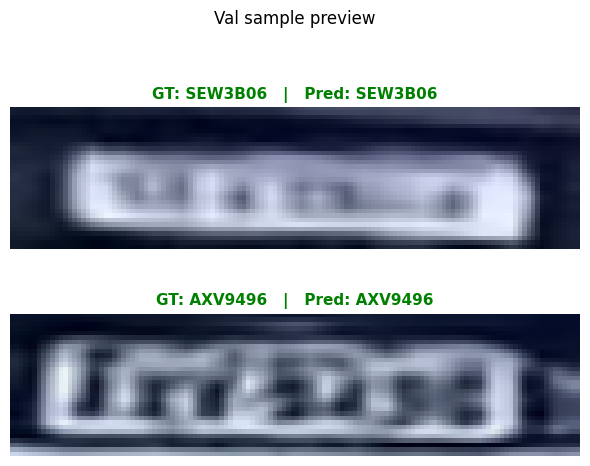

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  31 | Train Loss 0.0143  Acc 0.9710 | Val Loss 0.3917  Acc 0.7612 |


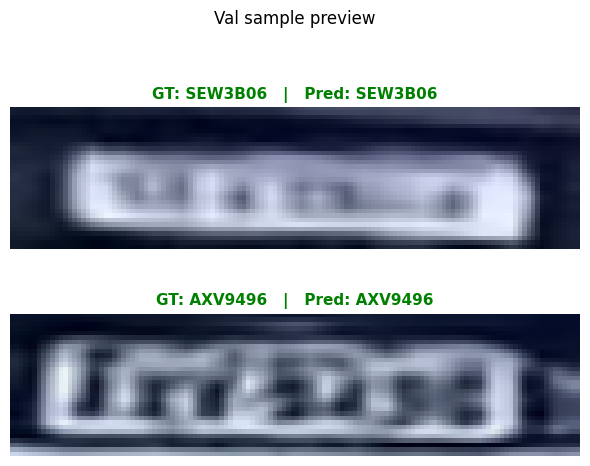

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:00<?, ?it/s]

| Epoch  32 | Train Loss 0.0118  Acc 0.9762 | Val Loss 0.3933  Acc 0.7559 |


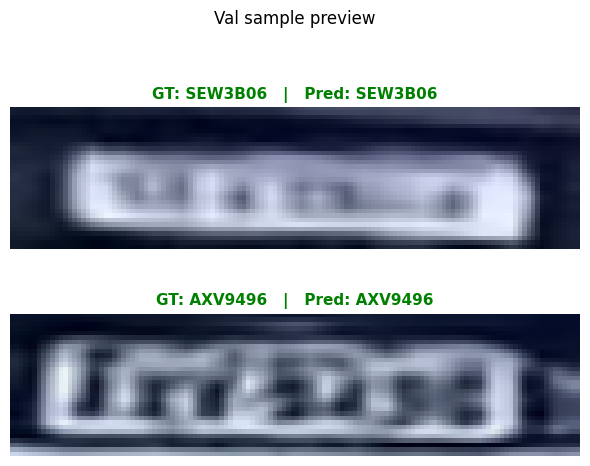

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  33 | Train Loss 0.0103  Acc 0.9789 | Val Loss 0.3993  Acc 0.7632 |


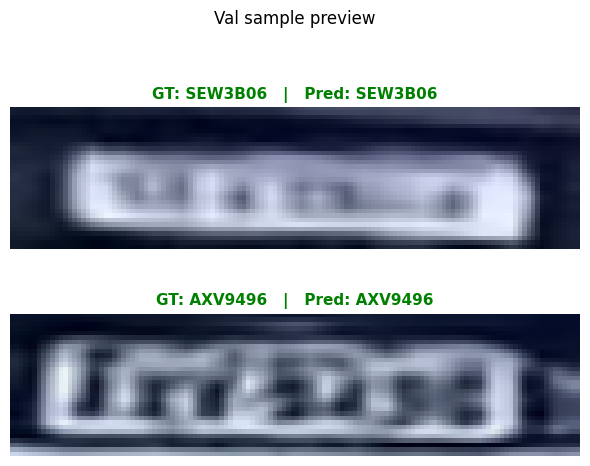

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  34 | Train Loss 0.0096  Acc 0.9811 | Val Loss 0.4071  Acc 0.7549 |


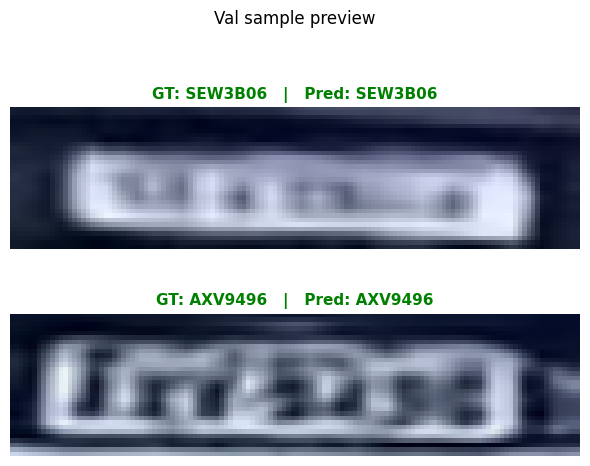

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  35 | Train Loss 0.0082  Acc 0.9837 | Val Loss 0.4147  Acc 0.7534 |


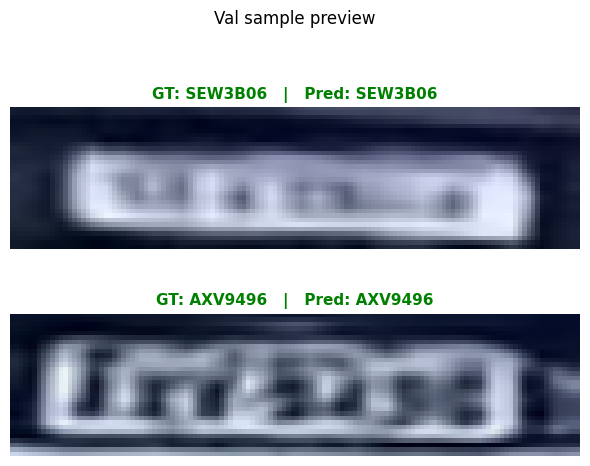

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  36 | Train Loss 0.0072  Acc 0.9859 | Val Loss 0.4133  Acc 0.7656 |


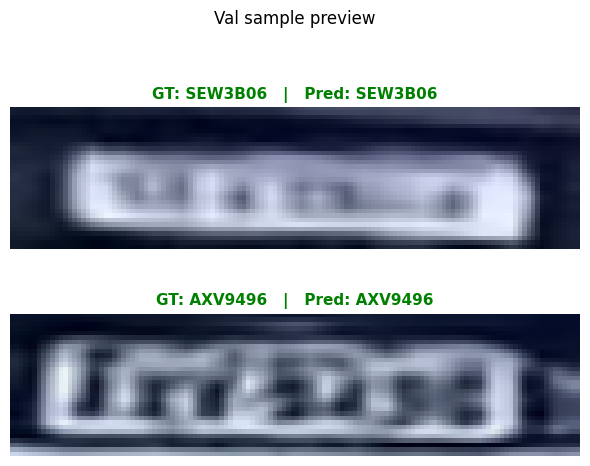

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  37 | Train Loss 0.0059  Acc 0.9883 | Val Loss 0.4304  Acc 0.7661 |


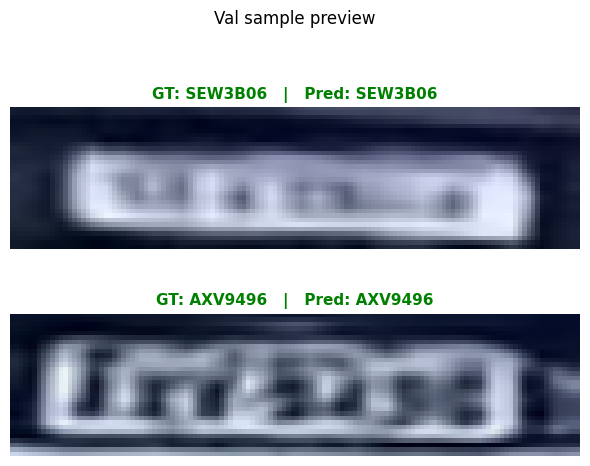

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  38 | Train Loss 0.0056  Acc 0.9887 | Val Loss 0.4279  Acc 0.7622 |


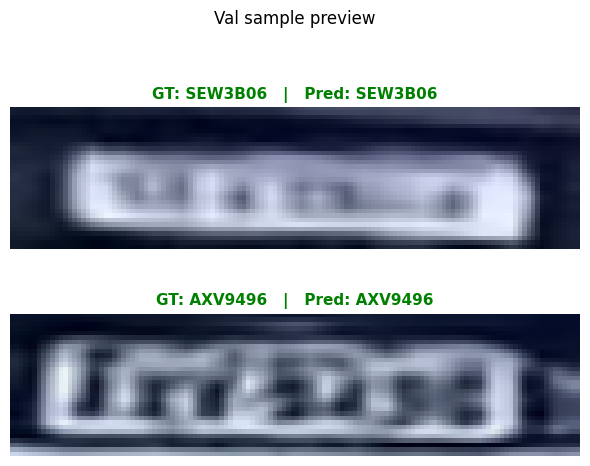

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  39 | Train Loss 0.0055  Acc 0.9892 | Val Loss 0.4101  Acc 0.7661 |


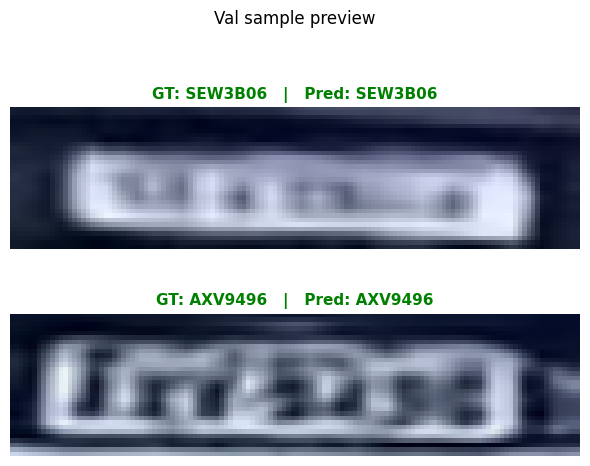

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  40 | Train Loss 0.0050  Acc 0.9907 | Val Loss 0.4248  Acc 0.7725 |


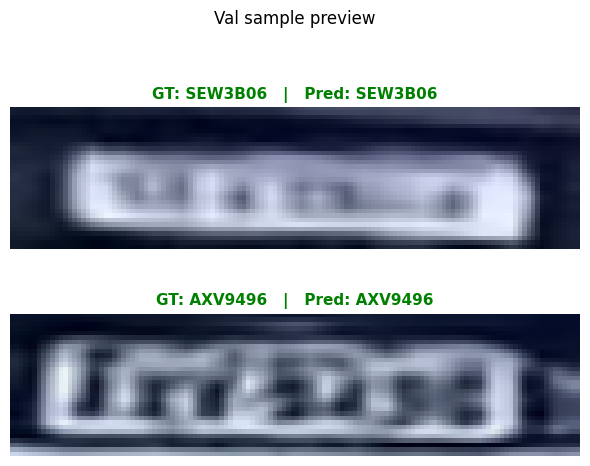

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  41 | Train Loss 0.0038  Acc 0.9923 | Val Loss 0.4346  Acc 0.7725 |


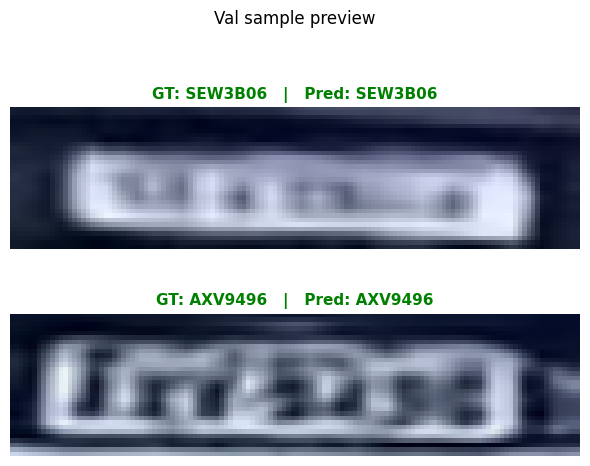

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  42 | Train Loss 0.0036  Acc 0.9931 | Val Loss 0.4310  Acc 0.7725 |


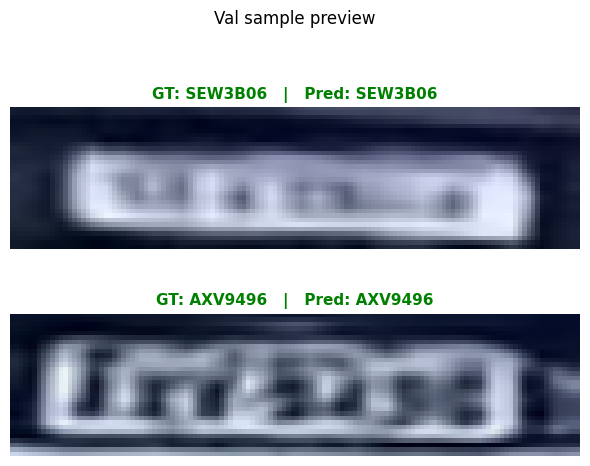

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  43 | Train Loss 0.0033  Acc 0.9932 | Val Loss 0.4338  Acc 0.7773 |


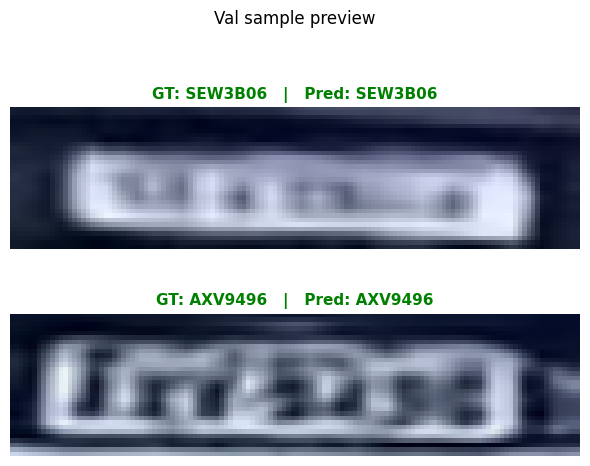

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  44 | Train Loss 0.0030  Acc 0.9938 | Val Loss 0.4445  Acc 0.7744 |


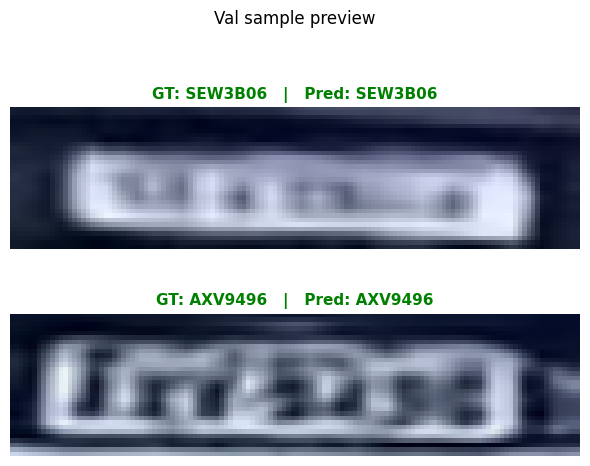

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  45 | Train Loss 0.0034  Acc 0.9930 | Val Loss 0.4366  Acc 0.7759 |


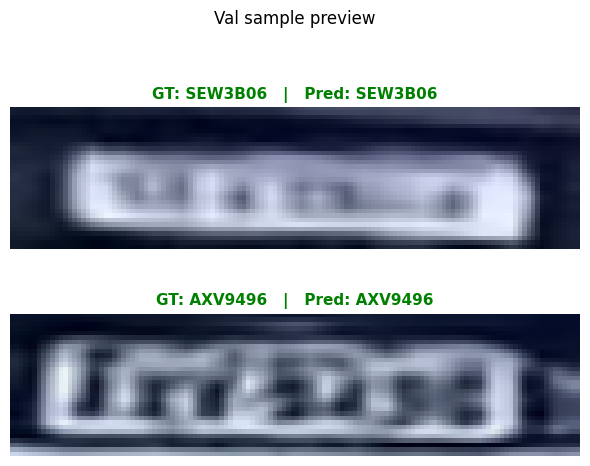

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  46 | Train Loss 0.0028  Acc 0.9945 | Val Loss 0.4325  Acc 0.7798 |


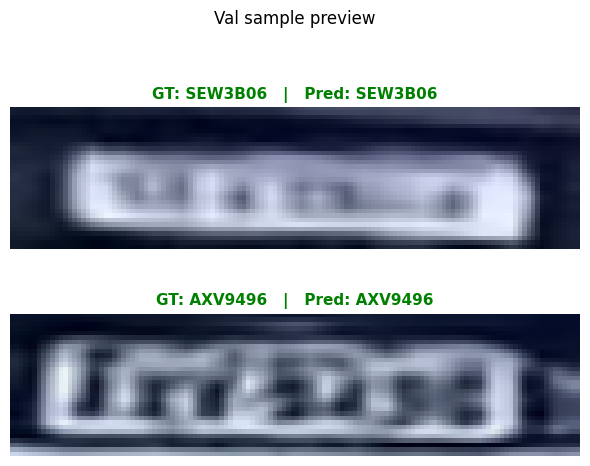

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  47 | Train Loss 0.0023  Acc 0.9957 | Val Loss 0.4355  Acc 0.7769 |


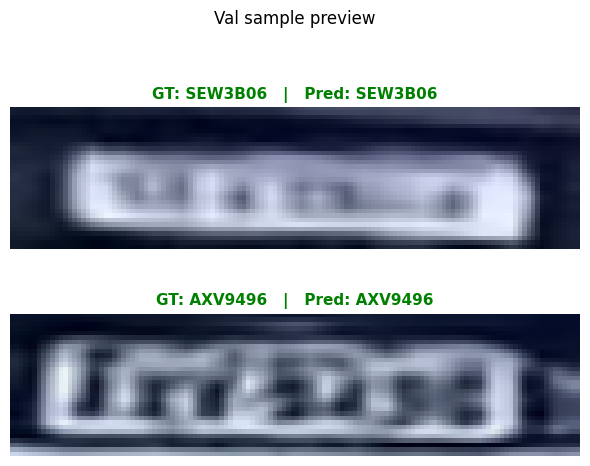

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  48 | Train Loss 0.0024  Acc 0.9953 | Val Loss 0.4365  Acc 0.7769 |


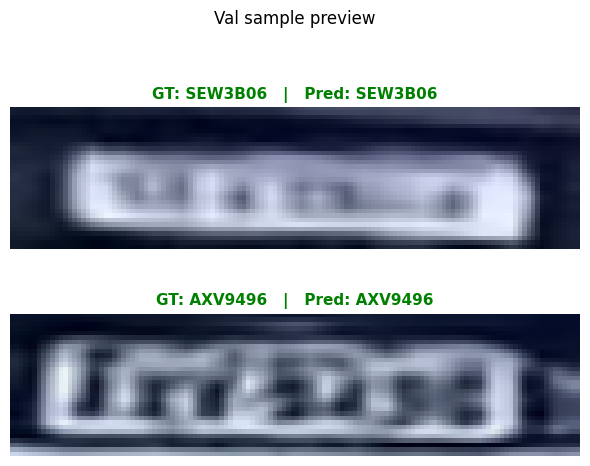

Train:   0%|          | 0/500 [00:01<?, ?it/s]

Val:   0%|          | 0/32 [00:01<?, ?it/s]

| Epoch  49 | Train Loss 0.0025  Acc 0.9951 | Val Loss 0.4365  Acc 0.7764 |


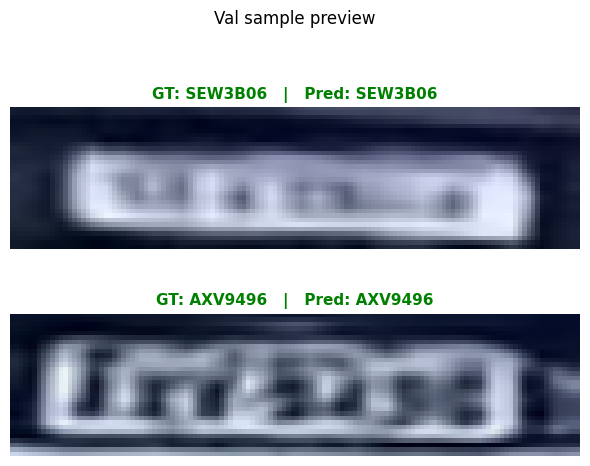

Training hoàn tất, đã load best model


In [29]:
model, metrics = train(
    model, optimizer, scheduler, criterion, train_loader, val_loader, epochs, early_stop_count,
    best_model_path, log_interval, warmup_epochs, device
)



# Visual loss/acc


In [30]:
checkpoint = torch.load(best_model_path, map_location=device)
best_epoch = checkpoint.get('epoch', checkpoint)
state_dict = checkpoint.get('model_state_dict', checkpoint)
train_loss_hint = checkpoint.get('train_loss_hist', checkpoint)
val_loss_hint = checkpoint.get('val_loss_hist', checkpoint)
train_acc_hint = checkpoint.get('train_acc_hist', checkpoint)
val_acc_hint = checkpoint.get('val_acc_hist', checkpoint)

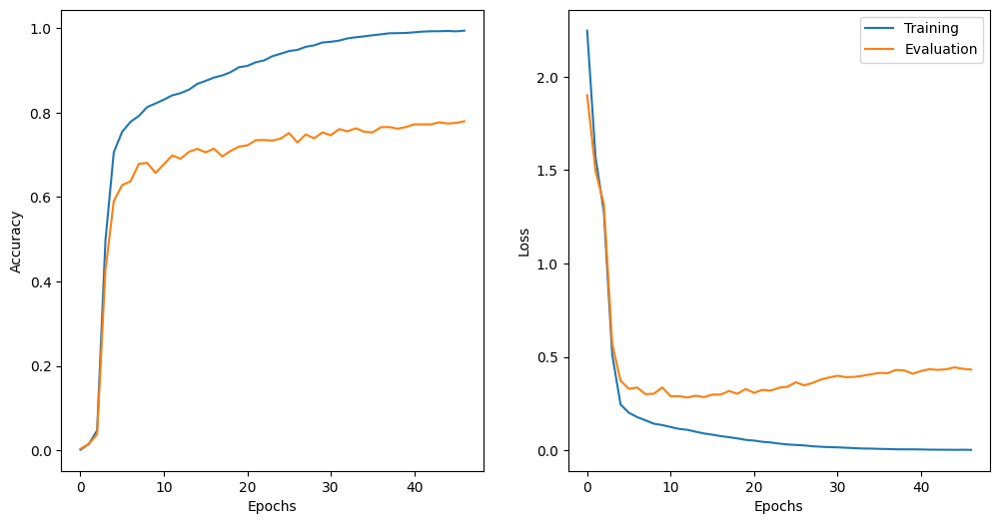

In [31]:
def plot_result(num_epochs, train_accs, eval_accs, train_losses, eval_losses):
    epochs = list(range(num_epochs))
    fig, axs = plt.subplots(nrows = 1, ncols =2 , figsize = (12,6))
    axs[0].plot(epochs, train_accs, label = "Training")
    axs[0].plot(epochs, eval_accs, label = "Evaluation")
    axs[1].plot(epochs, train_losses, label = "Training")
    axs[1].plot(epochs, eval_losses, label = "Evaluation")
    axs[0].set_xlabel("Epochs")
    axs[1].set_xlabel("Epochs")
    axs[0].set_ylabel("Accuracy")
    axs[1].set_ylabel("Loss")
    plt.legend()


plot_result(
     best_epoch + 1,
    train_acc_hint,
    val_acc_hint,
    train_loss_hint,
    val_loss_hint
)

# Evalute

In [32]:
checkpoint = torch.load(best_model_path, map_location=device)
state_dict = checkpoint.get('model_state_dict', checkpoint)

try:
    model.load_state_dict(state_dict)
except RuntimeError:
    if any(k.startswith('module.') for k in state_dict.keys()):
        state_dict = {k.replace('module.', '', 1): v for k, v in state_dict.items()}
    else:
        state_dict = {f'module.{k}': v for k, v in state_dict.items()}
    model.load_state_dict(state_dict)

model.eval()

DataParallel(
  (module): ResTranOCR(
    (stn): STNBlock(
      (localization): Sequential(
        (0): Conv2d(3, 32, kernel_size=(5, 5), stride=(2, 2), padding=(2, 2))
        (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
        (2): ReLU(inplace=True)
        (3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (4): ReLU(inplace=True)
        (5): AdaptiveAvgPool2d(output_size=(4, 8))
      )
      (fc_loc): Sequential(
        (0): Flatten(start_dim=1, end_dim=-1)
        (1): Linear(in_features=2048, out_features=128, bias=True)
        (2): ReLU(inplace=True)
        (3): Linear(in_features=128, out_features=6, bias=True)
      )
    )
    (extractor): FeatureExtractor(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_s

In [33]:
def visualize_predictions(model, loader, device='cpu', n_samples=6, mode='test'):
    """
    mode='test'       : hiện track_id, GT label, prediction (màu xanh/đỏ)
    mode='blind_test' : hiện track_id, prediction only
    """
    model.eval()

    batch = next(iter(loader))
    if mode == 'test':
        images, targets, track_ids = batch   # collate_fn_test phải trả thêm targets
    else:
        images, track_ids = batch

    images = images.to(device)
    with torch.no_grad():
        logits = model(images)
        preds  = decode_pred(logits.cpu())

    images_cpu = images.detach().cpu()
    n_samples  = min(n_samples, images_cpu.size(0))
    n_frames   = images_cpu.size(1)

    fig, axes = plt.subplots(
        n_samples, n_frames,
        figsize=(n_frames * 3, n_samples * 2.5)
    )
    if n_samples == 1:
        axes = [axes]

    for row_idx in range(n_samples):
        pred_label = preds[row_idx]
        track_id   = track_ids[row_idx]

        if mode == 'test':
            gt = ''.join(vocab[i] for i in targets[row_idx].tolist())
            correct = pred_label == gt
            color   = '#4CAF50' if correct else '#F44336'  # xanh nếu đúng, đỏ nếu sai
            title   = f'{track_id}\nGT: {gt}  |  Pred: {pred_label}'
        else:
            color = '#2196F3'
            title = f'{track_id}\nPred: {pred_label}'

        for col_idx in range(n_frames):
            ax  = axes[row_idx][col_idx]
            img = unnormalize(images_cpu[row_idx, col_idx])
            ax.imshow(img)
            ax.axis('off')
            ax.set_xlabel(f'frame {col_idx + 1}', fontsize=7, labelpad=2)

            if col_idx == 0:
                ax.set_title(title, fontsize=9, fontweight='bold',
                             color=color, loc='left', pad=3)

    plt.suptitle(
        f'{"Test" if mode == "test" else "Blind Test"} — Inference Preview',
        fontsize=12, fontweight='bold', y=1.01
    )
    plt.tight_layout()
    plt.savefig(f'inference_preview_{mode}.png', dpi=120, bbox_inches='tight')
    plt.show()

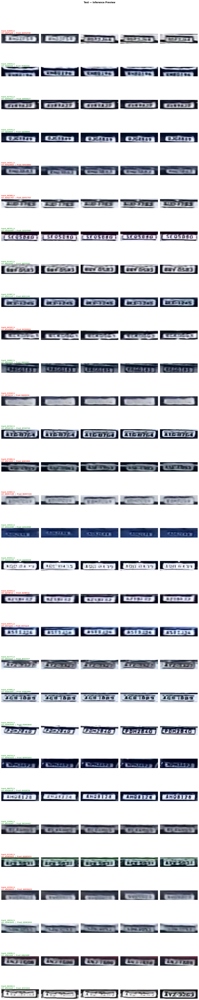

In [34]:
visualize_predictions(model, test_loader, device=device, n_samples=30, mode='test')

In [35]:
def evaluate_on_test(model, test_loader, device='cpu'):
    model.eval()

    total        = 0
    correct_raw  = 0
    correct_post = 0
    char_correct = 0
    char_total   = 0
    wrong_samples = []

    with torch.no_grad():
        for images, targets, track_ids in tqdm(test_loader, desc='Evaluating test set'):
            images  = images.to(device)
            logits  = model(images).cpu()           # (B, 7, 36)

            # Raw (không postprocess) — so sánh tensor
            preds_idx = logits.argmax(dim=2)        # (B, 7)
            B = targets.size(0)
            total        += B
            correct_raw  += (preds_idx == targets).all(dim=1).sum().item()
            char_correct += (preds_idx == targets).sum().item()
            char_total   += B * targets.size(1)

            # Postprocess — so sánh string
            preds_post = prediction_from_logits(logits)             
            gt_strs    = [''.join(vocab[i] for i in t.tolist()) for t in targets]
            correct_post += sum(p == g for p, g in zip(preds_post, gt_strs))

            # Thu thập mẫu sai (sau postprocess)
            for i in range(B):
                if preds_post[i] != gt_strs[i]:
                    wrong_samples.append({
                        'track_id': track_ids[i],
                        'gt':       gt_strs[i],
                        'pred_raw': ''.join(vocab[c] for c in preds_idx[i].tolist()),
                        'pred_post': preds_post[i]                  
                    })

    print(f"\n{'='*55}")
    print(f"  TEST SET EVALUATION")
    print(f"{'='*55}")
    print(f"  Sequence Acc (raw) : {correct_raw/total:.4f}  ({correct_raw}/{total})")
    print(f"  Sequence Acc (post): {correct_post/total:.4f}  ({correct_post}/{total})")  
    print(f"  Character Acc      : {char_correct/char_total:.4f}")
    print(f"  Wrong samples      : {len(wrong_samples)}")
    print(f"{'='*55}")

    if wrong_samples:
        print("\n  Sample wrong predictions (after postprocess):")
        for s in wrong_samples[:10]:
            print(f"  [{s['track_id']}]  GT: {s['gt']}  |  Raw: {s['pred_raw']}  |  Post: {s['pred_post']}")

    return {
        'seq_acc_raw':   correct_raw  / total,
        'seq_acc_post':  correct_post / total,
        'char_acc':      char_correct / char_total,
        'wrong_samples': wrong_samples
    }


# Chạy đánh giá
test_results = evaluate_on_test(model, test_loader, device=device)

Evaluating test set:   0%|          | 0/32 [00:00<?, ?it/s]

NameError: name 'prediction_from_logits' is not defined

In [ ]:
def predict_blind_test(model, test_loader, device='cpu', save_path='./test_predictions.csv', checkpoint_path=None):
    if checkpoint_path is not None:
        if not os.path.isfile(checkpoint_path):
            raise FileNotFoundError(f'Checkpoint not found: {checkpoint_path}')

        checkpoint = torch.load(checkpoint_path, map_location=device)
        state_dict = checkpoint.get('model_state_dict', checkpoint)

        # Handle DataParallel/non-DataParallel key mismatch automatically.
        try:
            model.load_state_dict(state_dict)
        except RuntimeError:
            if any(k.startswith('module.') for k in state_dict.keys()):
                state_dict = {k.replace('module.', '', 1): v for k, v in state_dict.items()}
            else:
                state_dict = {f'module.{k}': v for k, v in state_dict.items()}
            model.load_state_dict(state_dict)

        print(f'Loaded model weights from: {checkpoint_path}')

    model.eval()
    results = []

    with torch.no_grad():
        for images, track_ids in tqdm(test_loader, desc='Predict', leave=False):
            images = images.to(device)
            logits = model(images)
            preds = decode_pred(logits.cpu())

            for track_id, pred in zip(track_ids, preds):
                results.append({
                    'track_id': track_id,
                    'plate_text': pred
                })

    # Sort by numeric suffix if available (track_10005 -> 10005).
    def _sort_key(row):
        track_id = row['track_id']
        try:
            return int(track_id.split('_')[-1])
        except ValueError:
            return track_id

    results.sort(key=_sort_key)

    with open(save_path, 'w', encoding='utf-8') as f:
        f.write('track_id,plate_text\n')
        for row in results:
            f.write(f"{row['track_id']},{row['plate_text']}\n")

    print(f'Saved {len(results)} predictions to: {save_path}')
    return results


predict_blind_test(model, blind_test_loader, device)

In [ ]:
visualize_predictions(model, blind_test_loader, device=device, n_samples=16, mode='blind_test')